In [13]:
import cv2
import numpy as np
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt

In [14]:
# Load the GeoJSON
gdf_combined = gpd.read_file('data/Street_view/Preprocessed_to_use_for_picture_extraction.geojson')

# Recreate geometry_midpoint from midpoint_x and midpoint_y
gdf_combined['geometry_midpoint'] = gdf_combined.apply(lambda row: Point(row['midpoint_x'], row['midpoint_y']), axis=1)

In [16]:
def calculate_yaw_pitch(camera_coords, target_coords):
    x1, y1, z1 = camera_coords
    x2, y2, z2 = target_coords

    dx = x2 - x1
    dy = y2 - y1
    dz = z2 - z1
    
    horizontal_distance = np.sqrt(dx**2 + dy**2)
    
    if horizontal_distance < 1e-6:  # Adjust this threshold as needed
        print("Warning: Camera and target are very close or directly above/below each other.")
        return 0, 90 if dz >= 0 else -90

    yaw = np.arctan2(-dy, -dx)
    yaw_deg = np.degrees(yaw)
    yaw_deg = (yaw_deg + 360) % 360
    
    pitch = np.arctan2(dz, horizontal_distance)
    pitch_deg = np.degrees(pitch)
    
    return yaw_deg, pitch_deg


def enhanced_equirectangular_to_perspective(img, fov, theta, phi, roll, height, width, output_scale=2):
    fov, theta, phi, roll = map(np.radians, (fov, theta, phi, roll))
    
    h, w = img.shape[:2]
    
    # Increase output size
    height *= output_scale
    width *= output_scale
    
    f = width / (2 * np.tan(fov / 2))
    
    Rx = np.array([[1, 0, 0], [0, np.cos(phi), -np.sin(phi)], [0, np.sin(phi), np.cos(phi)]])
    Ry = np.array([[np.cos(theta), 0, np.sin(theta)], [0, 1, 0], [-np.sin(theta), 0, np.cos(theta)]])
    Rz = np.array([[np.cos(roll), -np.sin(roll), 0], [np.sin(roll), np.cos(roll), 0], [0, 0, 1]])
    
    R = Rz @ Ry @ Rx
    
    y, x = np.indices((height, width))
    x = (x - width / 2) / f
    y = (y - height / 2) / f
    
    directions = np.dstack([x, y, np.ones_like(x)])
    directions /= np.linalg.norm(directions, axis=2, keepdims=True)
    
    directions = directions @ R.T
    
    theta_p = np.arctan2(directions[:,:,0], directions[:,:,2])
    phi_p = np.arcsin(np.clip(directions[:,:,1], -1, 1))
    
    u = (theta_p / (2 * np.pi) + 0.5) * w
    v = (phi_p / np.pi + 0.5) * h
    
    u = np.clip(u, 0, w - 1)
    v = np.clip(v, 0, h - 1)
    
    u_floor, v_floor = np.floor(u).astype(int), np.floor(v).astype(int)
    u_ceil, v_ceil = np.minimum(u_floor + 1, w - 1), np.minimum(v_floor + 1, h - 1)
    
    wu, wv = u - u_floor, v - v_floor
    
    top_left = img[v_floor, u_floor]
    top_right = img[v_floor, u_ceil]
    bottom_left = img[v_ceil, u_floor]
    bottom_right = img[v_ceil, u_ceil]
    
    output = (1 - wu[:,:,np.newaxis]) * ((1 - wv[:,:,np.newaxis]) * top_left + wv[:,:,np.newaxis] * bottom_left) + \
              wu[:,:,np.newaxis] * ((1 - wv[:,:,np.newaxis]) * top_right + wv[:,:,np.newaxis] * bottom_right)
    
    return output.astype(np.uint8)

def convert_bgr_to_rgb(image):
    # Converts the image from OpenCV's BGR format to RGB for correct color representation
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def calculate_dynamic_fov(v1, v2):
    """
    Calculate the dynamic Field of View based on the vectors v1 and v2.
    
    Parameters:
    v1, v2: numpy arrays representing the vectors
    
    Returns:
    fov: The calculated Field of View in degrees, capped at 120°
    """
    # Ensure v1 and v2 are numpy arrays
    v1 = np.array(v1)
    v2 = np.array(v2)
    
    # Calculate the dot product of v1 and v2
    dot_product = np.dot(v1, v2)
    
    # Calculate the magnitudes of v1 and v2
    magnitude_product = np.linalg.norm(v1) * np.linalg.norm(v2)
    
    # Calculate the FoV using the arccos function
    fov_radians = np.arccos(dot_product / magnitude_product)
    
    # Convert to degrees
    fov_degrees = np.degrees(fov_radians)
    
    # Cap the FoV at 120°
    fov = min(fov_degrees, 120)
    
    return fov

def calculate_vectors(camera_coords, target_coords):
    """
    Calculate the vectors v1 and v2 based on camera and target coordinates.
    
    Parameters:
    camera_coords: (x, y, z) coordinates of the camera
    target_coords: (x, y, z) coordinates of the target
    
    Returns:
    v1, v2: numpy arrays representing the vectors
    """
    camera = np.array(camera_coords)
    target = np.array(target_coords)
    
    # Calculate v2 (vector from camera to target)
    v2 = target - camera
    
    # Assume v1 is the forward-facing vector of the camera
    # For simplicity, let's assume it's pointing along the x-axis
    v1 = np.array([1, 0, 0])
    
    return v1, v2

def adjust_fov_based_on_distance(camera_coords, midpoint_coords, calculated_fov):
    """
    Adjust the field of view based on the distance between the camera and the midpoint.
    Wider FoV (e.g., 110) is used when very close, and calculated FoV when farther away.
    
    Parameters:
    - camera_coords: (x, y, z) of the camera
    - midpoint_coords: (x, y, z) of the midpoint
    - calculated_fov: the dynamically calculated FoV based on angle
    
    Returns:
    - Adjusted FoV
    """
    x1, y1, _ = camera_coords
    x2, y2, _ = midpoint_coords
    
    # Calculate the Euclidean distance between the camera and the midpoint
    distance = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

    print(f"Distance: {distance}")
    
    if 3.5 < distance < 5:  # If very close, set a wider FoV (e.g., 110 degrees)
        return 100, distance
    elif distance <3.5:
        return 110, distance
    else:
        # Use the dynamically calculated FoV if the distance is larger
        return calculated_fov, distance

Distance: 2.736775955028779
82.91780039245711 110
block_0 34 182136815 POINT (605189.9574258039 4962337.061895148) S pano_000117_000042.jpg


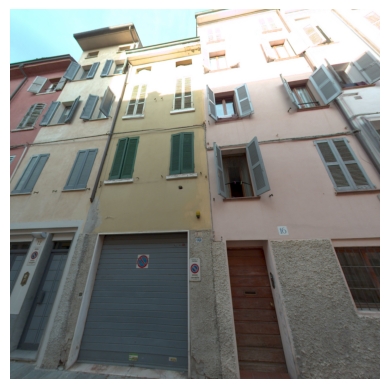

Distance: 3.077008157232727
93.02456302756967 110
block_0 76 182137529 POINT (605186.7396445274 4962338.653721904) S pano_000117_000043.jpg


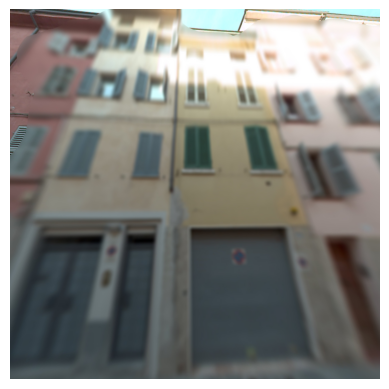

Distance: 3.1491606064152977
63.88086476695311 110
block_0 124 182138139 POINT (605182.7413835118 4962340.810570208) S pano_000117_000045.jpg


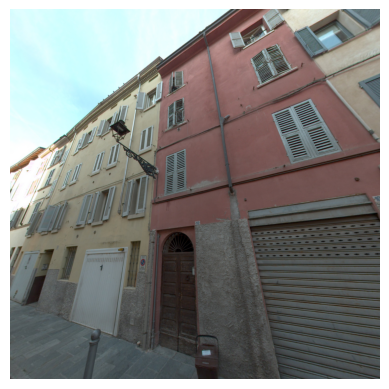

Distance: 3.6238365862048925
67.926814095519 100
block_0 12 182136647 POINT (605177.147803768 4962343.780226035) S pano_000117_000047.jpg


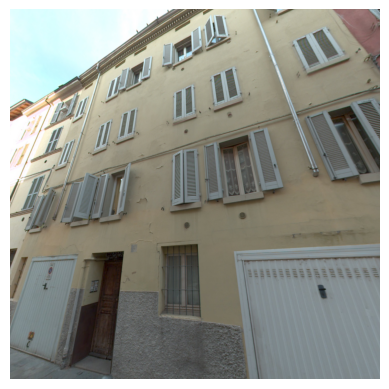

Distance: 3.7756205469492525
59.55109848898959 100
block_0 12 182136647 POINT (605172.1463701997 4962346.092892471) S pano_000117_000049.jpg


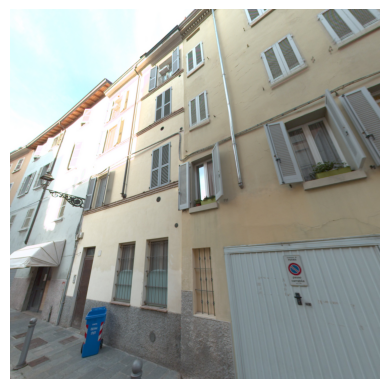

Distance: 3.6694732318857435
88.18186931274245 100
block_0 117 182137984 POINT (605167.5844215297 4962347.651625912) S pano_000117_000050.jpg


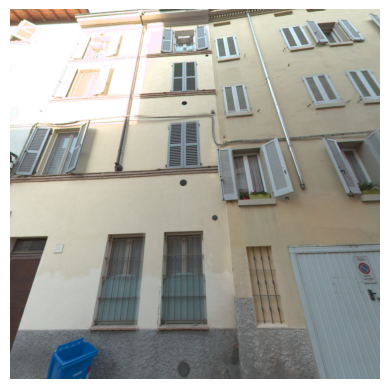

Distance: 3.2194823873591414
96.09966359766375 110
block_0 168 2427045 POINT (605155.8669034896 4962351.6822555065) S pano_000117_000054.jpg


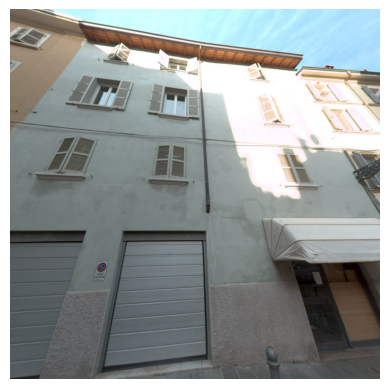

Distance: 2.9161493973254466
57.88119689741341 110
block_0 64 182137239 POINT (605143.4584482685 4962356.123825394) S pano_000117_000059.jpg


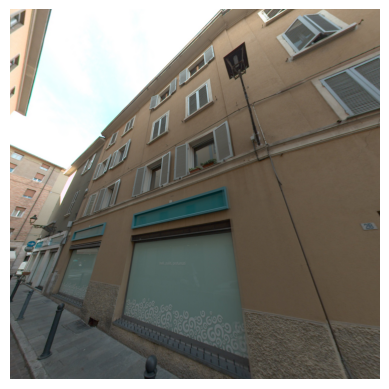

Distance: 2.9209987247413816
71.44234497774916 110
block_0 181 2427080 POINT (605131.5536334473 4962360.968118127) S pano_000117_000063.jpg


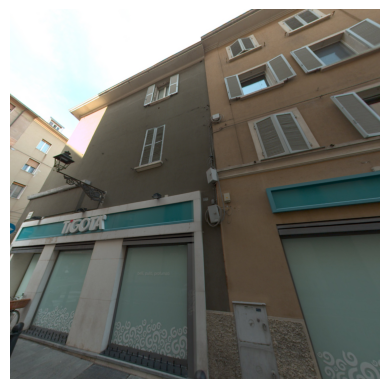

Distance: 7.496849290970828
118.58888720532043 118.58888720532043
block_0 6 182136604 POINT (605134.2705959831 4962390.963198035) N pano_000116_000069.jpg


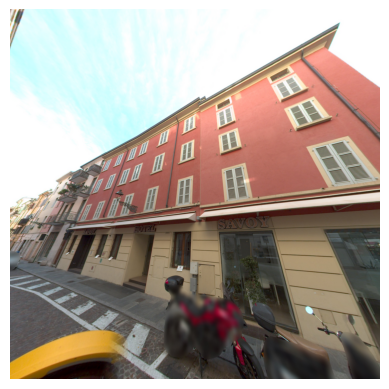

Distance: 7.193270222266305
101.90373648620799 101.90373648620799
block_0 4 182136595 POINT (605144.7712585563 4962387.090417201) N pano_000116_000066.jpg


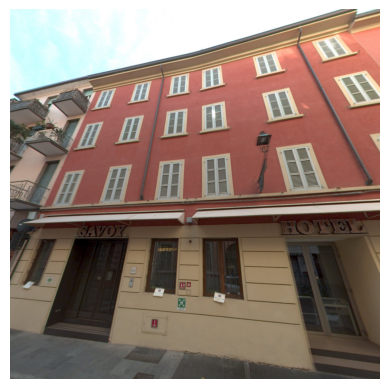

Distance: 7.135606890710485
109.43856906449294 109.43856906449294
block_0 136 182138240 POINT (605155.2402986144 4962383.2171309255) N pano_000116_000062.jpg


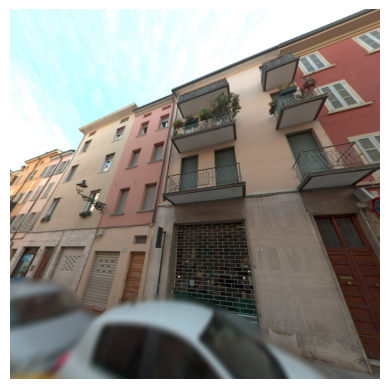

Distance: 7.161150198697376
108.92509067565985 108.92509067565985
block_0 122 182138083 POINT (605160.9584120393 4962381.093957091) N pano_000116_000060.jpg


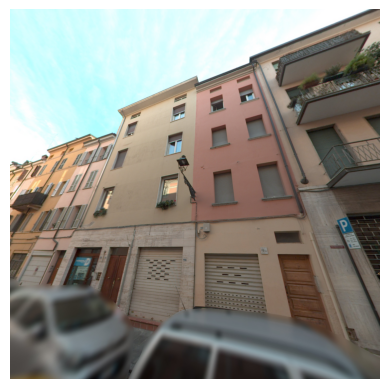

Distance: 7.100352247855278
109.60727984687583 109.60727984687583
block_0 5 182136600 POINT (605166.5213258333 4962379.02936293) N pano_000116_000058.jpg


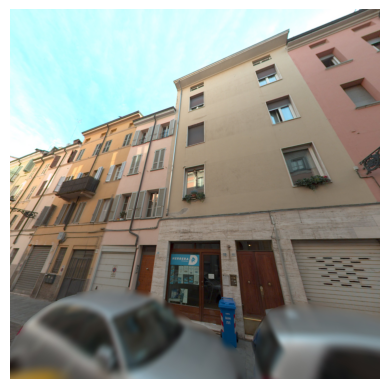

Distance: 7.021658740062881
112.3079843981957 112.3079843981957
block_0 112 182137955 POINT (605171.8656830523 4962377.027864454) N pano_000116_000056.jpg


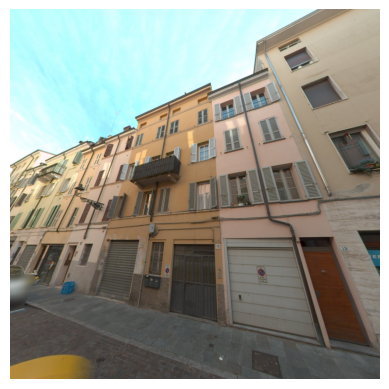

Distance: 7.016415996589163
119.03354955117227 119.03354955117227
block_0 109 182137941 POINT (605176.8317812656 4962375.18129717) N pano_000116_000054.jpg


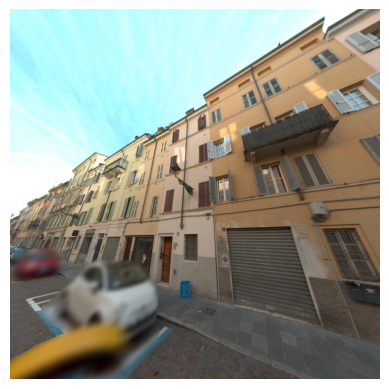

Distance: 7.033863890203779
100.49456948497321 100.49456948497321
block_0 108 182137940 POINT (605181.8018356322 4962373.334797351) N pano_000116_000053.jpg


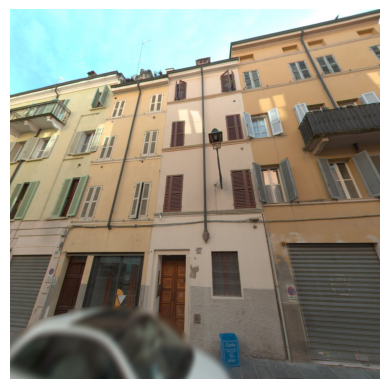

Distance: 6.987383767279174
117.16123435760849 117.16123435760849
block_0 94 182137728 POINT (605185.6142868828 4962371.897146926) N pano_000116_000051.jpg


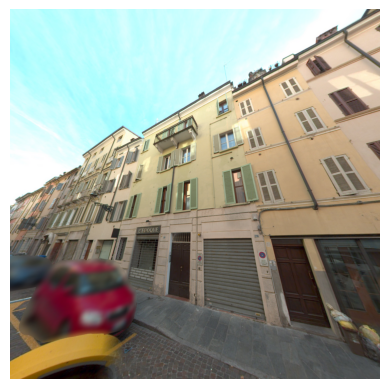

Distance: 6.9208551729014545
112.8708494110525 112.8708494110525
block_0 169 2427048 POINT (605191.8021734767 4962369.587239882) N pano_000116_000049.jpg


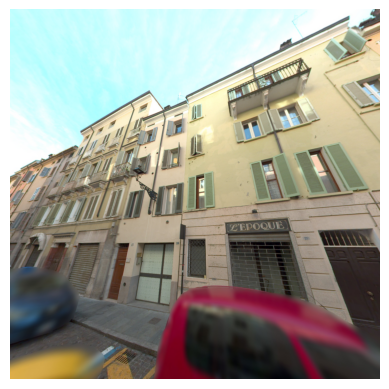

Distance: 6.8573657947588
111.72812083203259 111.72812083203259
block_0 101 182137837 POINT (605197.6473844483 4962367.4328432735) N pano_000116_000047.jpg


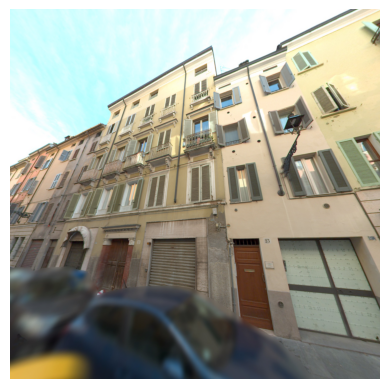

Distance: 6.97412753878838
101.06314826806616 101.06314826806616
block_0 34 182136815 POINT (605204.519729262 4962364.867477639) N pano_000116_000045.jpg


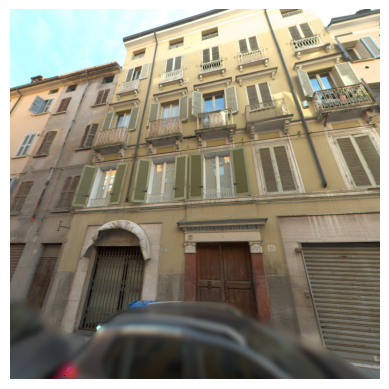

Distance: 6.955543517214027
110.97585475626614 110.97585475626614
block_0 16 182136664 POINT (605211.9250928299 4962362.116390858) N pano_000116_000042.jpg


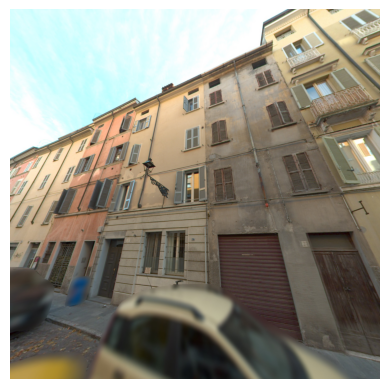

Distance: 6.958400460954078
117.88189525340714 117.88189525340714
block_0 15 182136662 POINT (605216.8619003221 4962360.36937627) N pano_000116_000040.jpg


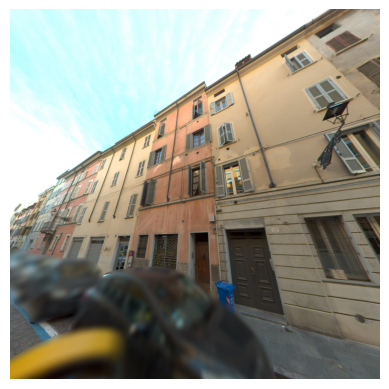

Distance: 6.898214699845341
118.91129744029621 118.91129744029621
block_0 166 2427037 POINT (605222.4870236414 4962358.372515196) N pano_000116_000038.jpg


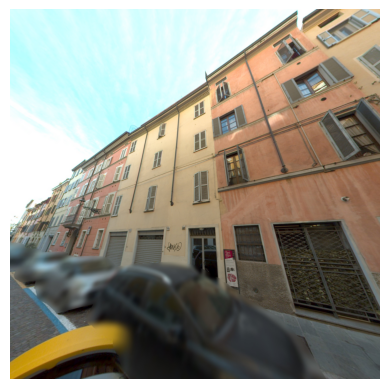

Distance: 6.866247461839499
102.41565316105148 102.41565316105148
block_0 14 182136652 POINT (605230.081742066 4962355.65232951) N pano_000116_000036.jpg


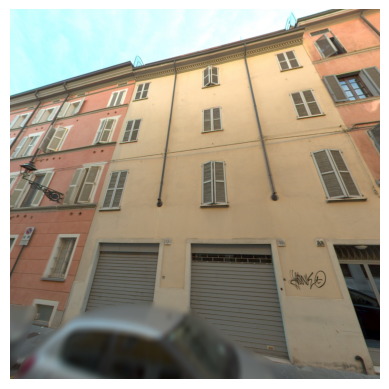

Distance: 6.715106888495123
103.14197780300215 103.14197780300215
block_0 28 182136749 POINT (605241.4552208579 4962351.621764114) N pano_000116_000032.jpg


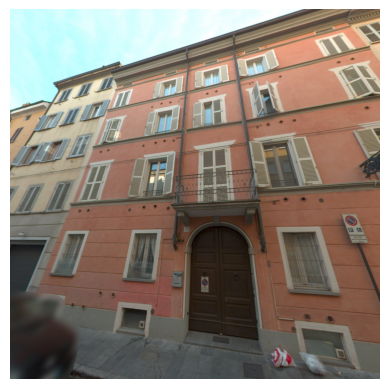

Distance: 6.738452653557371
119.14160769336239 119.14160769336239
block_0 103 182137892 POINT (605251.1425772081 4962348.152508633) N pano_000116_000028.jpg


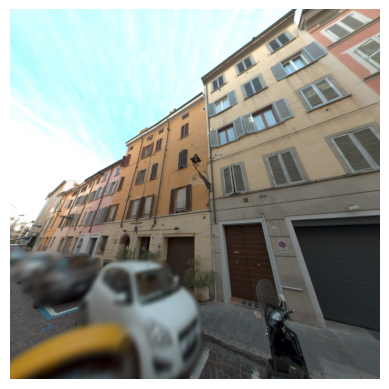

Distance: 6.787418996361651
99.06743748187495 99.06743748187495
block_0 10 182136612 POINT (605259.0523239998 4962345.276399767) N pano_000116_000026.jpg


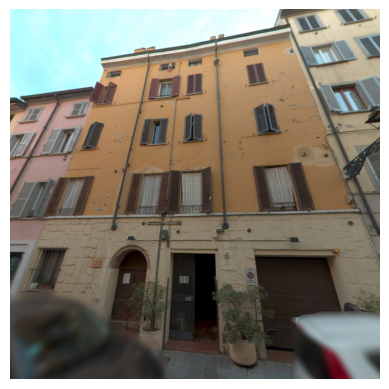

Distance: 6.5871183459586335
111.12279339870574 111.12279339870574
block_0 72 182137474 POINT (605266.2732138163 4962342.683468508) N pano_000116_000023.jpg


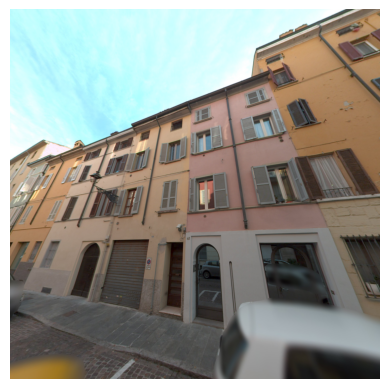

Distance: 6.694371676483456
120 120
block_0 133 182138214 POINT (605270.9604041779 4962340.96574079) N pano_000116_000021.jpg


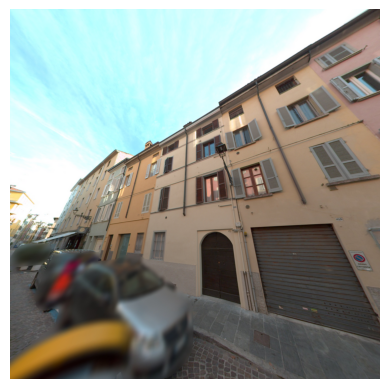

Distance: 6.8587210400801855
120 120
block_0 121 182138080 POINT (605276.582700306 4962338.902211865) N pano_000116_000019.jpg


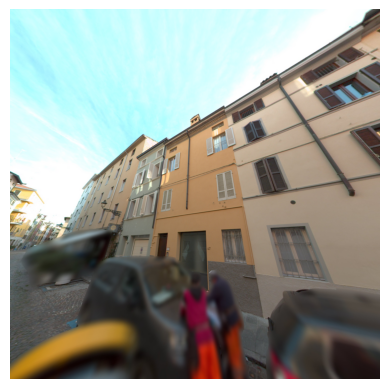

Distance: 6.867029726129836
100.36178121636931 100.36178121636931
block_0 84 182137642 POINT (605281.7668752945 4962337.025960088) N pano_000116_000018.jpg


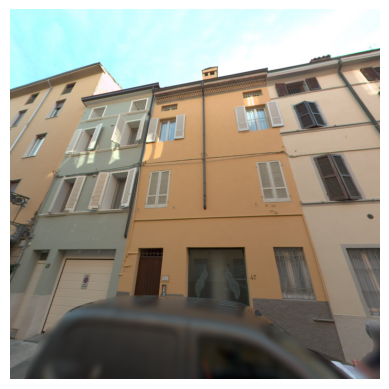

Distance: 6.7939923279291285
110.90733251616055 110.90733251616055
block_0 116 182137975 POINT (605286.2355125251 4962335.371332195) N pano_000116_000016.jpg


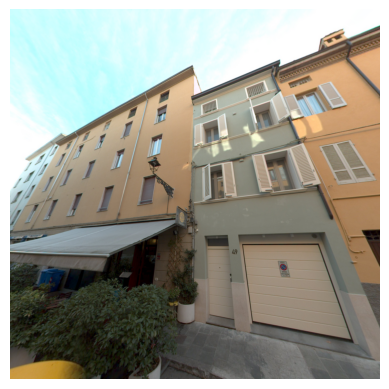

Distance: 6.831151427496812
115.80452789925613 115.80452789925613
block_0 47 182136877 POINT (605291.3613844321 4962333.433021115) N pano_000116_000014.jpg


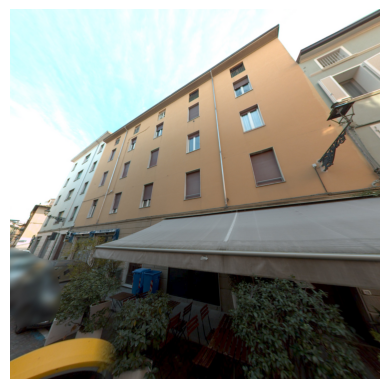

Distance: 6.954750618675
109.85372615012041 109.85372615012041
block_0 47 182136877 POINT (605300.4250273625 4962329.653620832) N pano_000116_000011.jpg


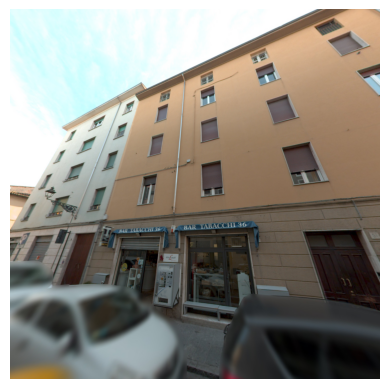

Distance: 7.037213882687413
120 120
block_0 8 182136607 POINT (605313.1119913978 4962324.155770952) N pano_000116_000006.jpg


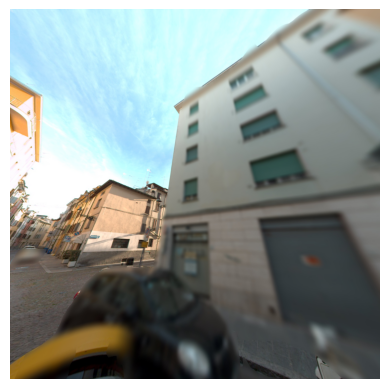

Distance: 6.762040073109462
120 120
block_0 62 182137189 POINT (605321.1744215561 4962320.654442409) N pano_000116_000003.jpg


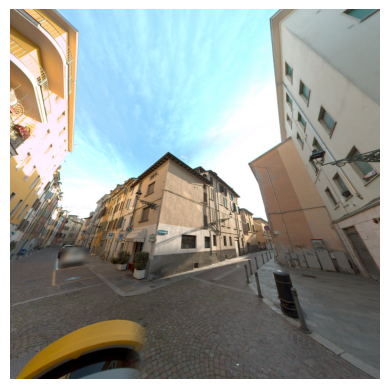

Distance: 4.247614167854027
77.648453543658 100
block_0 74 182137491 POINT (605301.1746041913 4962287.998296874) S pano_000117_000002.jpg


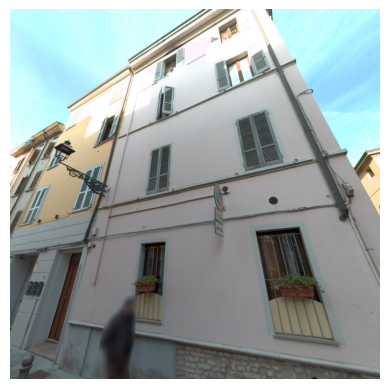

Distance: 4.6105502999733
78.98196555707634 100
block_0 163 2427027 POINT (605292.611158983 4962291.902564376) S pano_000117_000005.jpg


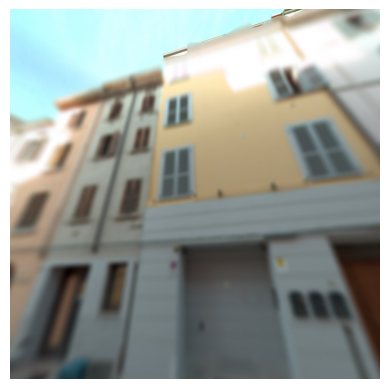

Distance: 4.360002583742973
71.39934959512908 100
block_0 69 182137376 POINT (605284.8607103209 4962295.431256929) S pano_000117_000008.jpg


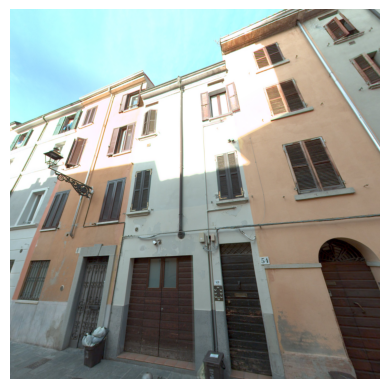

Distance: 4.304112929872523
53.70647031425429 100
block_0 137 182138243 POINT (605280.580699835 4962297.40009407) S pano_000117_000010.jpg


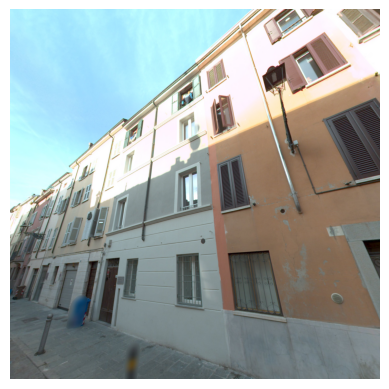

Distance: 4.258551736645965
48.45579857422397 100
block_0 1 182136570 POINT (605275.3922614644 4962299.776288828) S pano_000117_000012.jpg


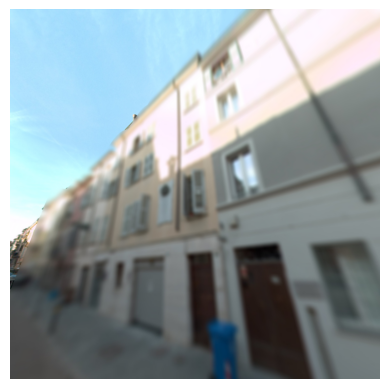

Distance: 4.002336985649004
74.36209489362226 100
block_0 11 182136621 POINT (605268.1758577912 4962303.058188269) S pano_000117_000014.jpg


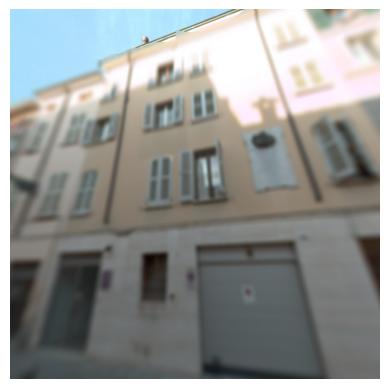

Distance: 4.078912273244686
79.56088319838649 100
block_0 2 182136574 POINT (605262.3020605787 4962305.74539811) S pano_000117_000016.jpg


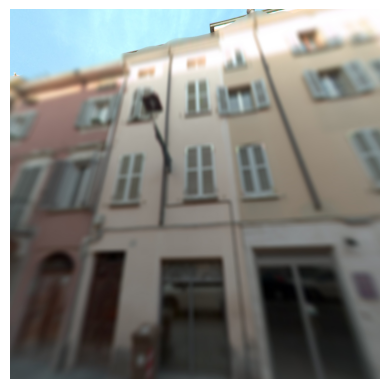

Distance: 4.006429326137638
59.15908649556348 100
block_0 120 182138057 POINT (605258.0819204188 4962307.681896344) S pano_000117_000018.jpg


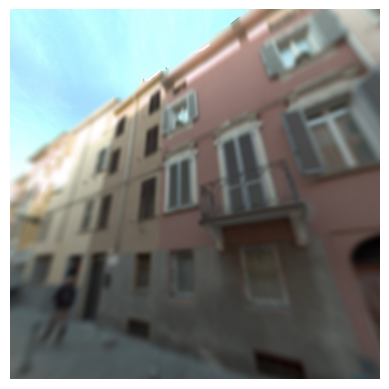

Distance: 4.329412079580943
48.88031019132889 100
block_0 71 182137460 POINT (605253.3321693218 4962309.837508211) S pano_000117_000020.jpg


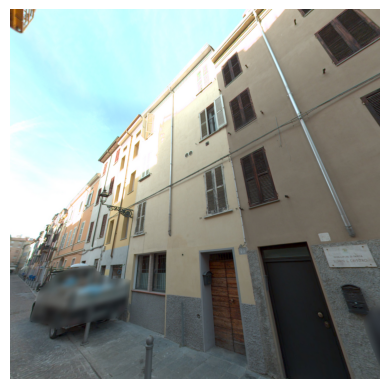

Distance: 4.424651902819287
78.31347792383185 100
block_0 167 2427043 POINT (605248.5502439637 4962312.025931019) S pano_000117_000021.jpg


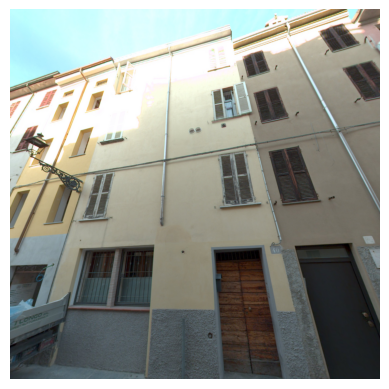

Distance: 4.600817989903869
57.669113162993575 100
block_0 111 182137952 POINT (605244.426553959 4962313.869569985) S pano_000117_000023.jpg


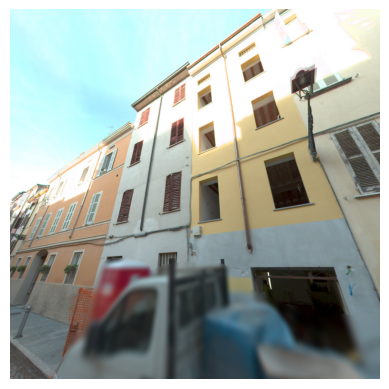

Distance: 4.2454739101369965
76.36843318047544 100
block_0 26 182136738 POINT (605240.2085629932 4962315.433884441) S pano_000117_000024.jpg


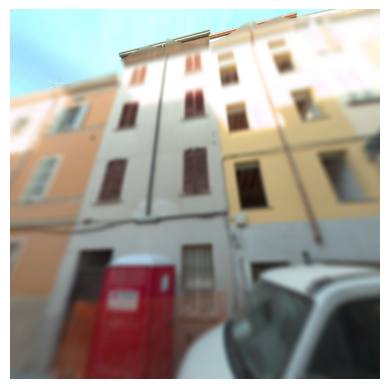

Distance: 3.8174116253523667
44.360608206072854 100
block_0 183 2427083 POINT (605236.5502719583 4962316.874027181) S pano_000117_000026.jpg


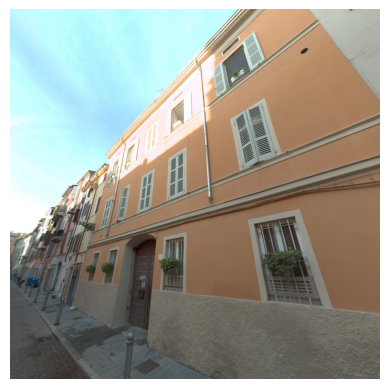

Distance: 3.3763616610987954
66.2629480616248 110
block_0 183 2427083 POINT (605229.8011200549 4962320.1247298075) S pano_000117_000028.jpg


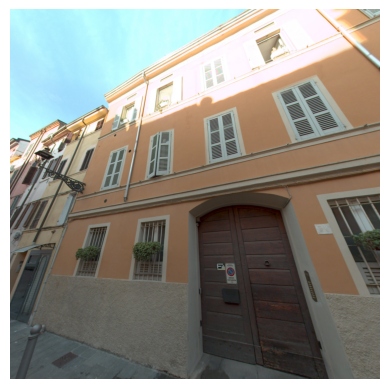

Distance: 3.5835365519397766
50.83722629955621 100
block_0 104 182137901 POINT (605222.4590953263 4962323.593512869) S pano_000117_000031.jpg


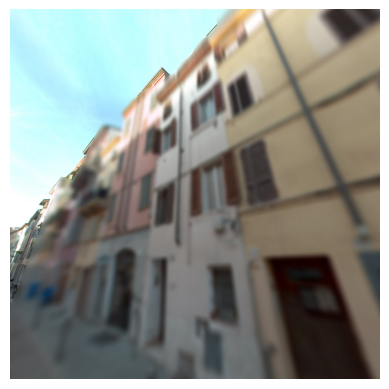

Distance: 3.6156215420704694
59.63515483737338 100
block_0 102 182137853 POINT (605219.2067128094 4962325.123645015) S pano_000117_000032.jpg


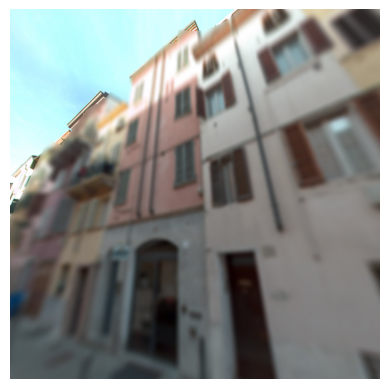

Distance: 3.704216370976014
70.58059325389885 100
block_0 87 182137654 POINT (605215.8005800567 4962326.623483861) S pano_000117_000033.jpg


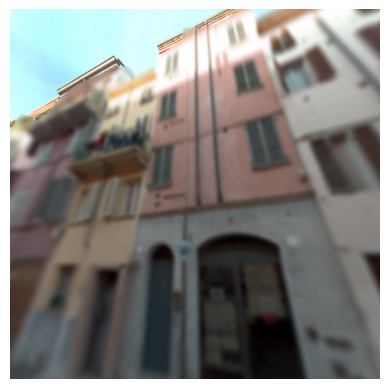

Distance: 3.742667036302111
79.1122355839789 100
block_0 78 182137556 POINT (605212.4879364334 4962327.969295556) S pano_000117_000034.jpg


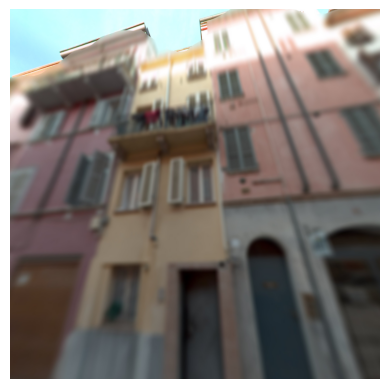

Distance: 3.659093933225462
48.888195252449016 100
block_0 60 182137110 POINT (605208.5829658262 4962329.49986359) S pano_000117_000036.jpg


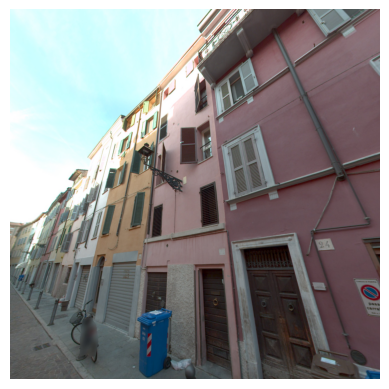

Distance: 3.3134451510259897
67.93150399076363 110
block_0 96 182137766 POINT (605204.6459102365 4962331.057686775) S pano_000117_000037.jpg


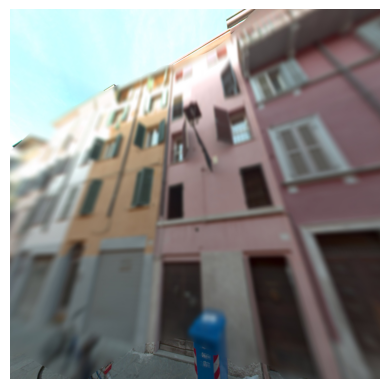

Distance: 3.2474036295353987
81.75632028255295 110
block_0 91 182137721 POINT (605201.0826239454 4962332.493848888) S pano_000117_000038.jpg


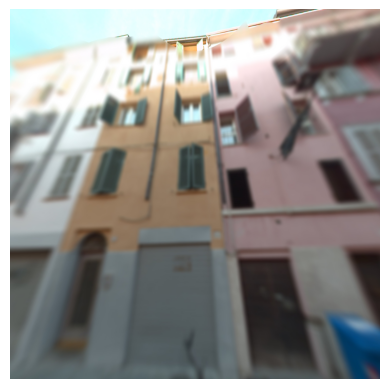

Distance: 3.11144691901218
43.17358851095607 110
block_0 115 182137972 POINT (605197.3961287781 4962333.966886216) S pano_000117_000040.jpg


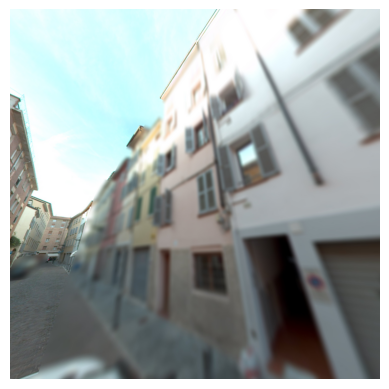

Distance: 2.718123451019835
62.9352204327723 110
block_0 97 182137768 POINT (605193.6137396365 4962335.499468997) S pano_000117_000041.jpg


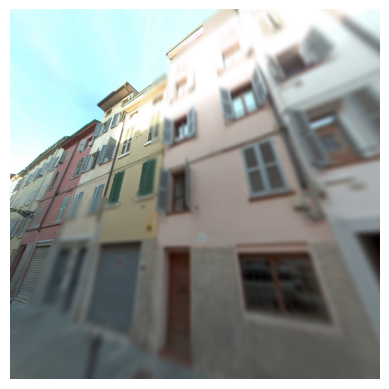

Distance: 50.89569322532305
113.08717255916541 113.08717255916541


In [17]:
# Ensure all previous figures are closed
plt.close('all')

# Set %matplotlib inline to make sure interactive plotting is turned off
%matplotlib inline

images_folder = 'data/PANO/'

for i, row in gdf_combined.iterrows():
    # Coordinates for camera and target
    camera_coords = (row.loc['X'], row.loc['Y'], row.loc['Z'])  # Camera position (x, y, z)
    target_coords = (row.loc['geometry_midpoint'].x, row.loc['geometry_midpoint'].y, row.loc['Z'])  # Target position (x, y, z)
    
    # Calculate the yaw and pitch based on the coordinates
    yaw, pitch = calculate_yaw_pitch(camera_coords, target_coords)

    # adjust pitch
    pitch_adjustment = 25  # degrees
    pitch += pitch_adjustment

    # Calculate dynamic FoV based on vectors
    v1, v2 = calculate_vectors(camera_coords, target_coords)
    calculated_fov = calculate_dynamic_fov(v1, v2)

    # Adjust FoV based on the distance between camera and midpoint
    fov, distance = adjust_fov_based_on_distance(camera_coords, target_coords, calculated_fov)
    print(calculated_fov, fov)

    if distance > 20:
        break

    # Path to the image
    path = row.loc['PATH']
    run = row.loc['RUN']
    image_name = row.loc['FOTO']
    image_path = '{}{}/{}/{}'.format(images_folder, path, run, image_name)
    image = cv2.imread(image_path)

    # Convert the original image to RGB before any further processing
    rgb_image = convert_bgr_to_rgb(image)

    # Parameters for perspective projection
    roll = row.loc['Roll']

    output_image_shape = 'squared'  # 'squared', 'horizontal' or 'vertical'
    if output_image_shape == 'squared':
        output_width = 1024
        output_height = 1024
    elif output_image_shape == 'horizontal':
        output_width = 1024
        output_height = 512
    elif output_image_shape == 'vertical':
        output_width = 512
        output_height = 1024

    # Apply the transformation
    output_image = enhanced_equirectangular_to_perspective(rgb_image, fov, yaw, pitch, roll, output_height, output_width)

    print(row.loc['group_id'], row.loc['building_id'], row.loc['osm_id'], row.loc['geometry_midpoint'], row.loc['orientation_midpoint'], image_name)

    # Display the transformed image
    plt.imshow(output_image)
    plt.axis('off')  # Hide the axes
    plt.show()  # Show the image
    
    # Close the figure to prevent old plots from showing up again
    plt.close('all')  # Close all figures


Distance: 2.736775955028779
82.91780039245711 110
block_0 34 182136815 POINT (605189.9574258039 4962337.061895148) S pano_000117_000042.jpg


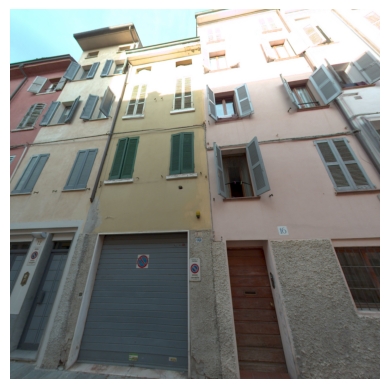

Distance: 3.077008157232727
93.02456302756967 110
block_0 76 182137529 POINT (605186.7396445274 4962338.653721904) S pano_000117_000043.jpg


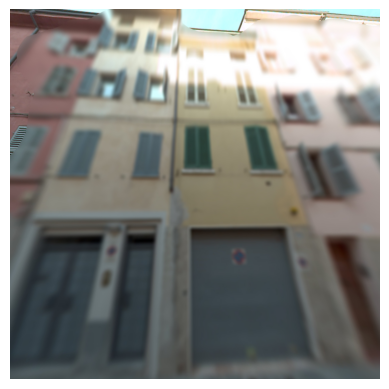

Distance: 3.1491606064152977
63.88086476695311 110
block_0 124 182138139 POINT (605182.7413835118 4962340.810570208) S pano_000117_000045.jpg


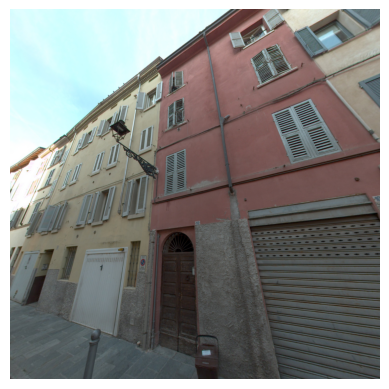

Distance: 3.6238365862048925
67.926814095519 100
block_0 12 182136647 POINT (605177.147803768 4962343.780226035) S pano_000117_000047.jpg


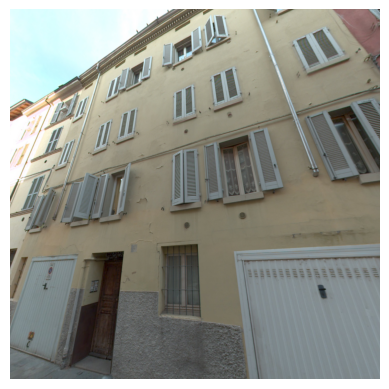

Distance: 3.7756205469492525
59.55109848898959 100
block_0 12 182136647 POINT (605172.1463701997 4962346.092892471) S pano_000117_000049.jpg


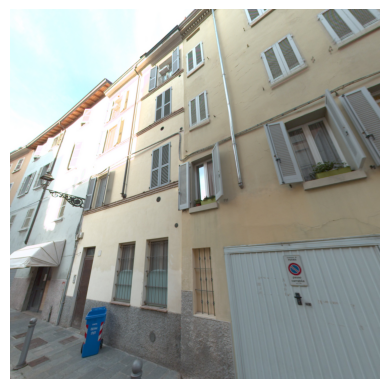

Distance: 3.6694732318857435
88.18186931274245 100
block_0 117 182137984 POINT (605167.5844215297 4962347.651625912) S pano_000117_000050.jpg


In [ ]:
# Ensure all previous figures are closed
plt.close('all')

# Set %matplotlib inline to make sure interactive plotting is turned off
%matplotlib inline

images_folder = 'data/PANO/'

for i, row in gdf_combined.iterrows():
    # Coordinates for camera and target
    camera_coords = (row.loc['X'], row.loc['Y'], row.loc['Z'])  # Camera position (x, y, z)
    target_coords = (row.loc['geometry_midpoint'].x, row.loc['geometry_midpoint'].y, row.loc['Z'])  # Target position (x, y, z)
    
    # Calculate the yaw and pitch based on the coordinates
    yaw, pitch = calculate_yaw_pitch(camera_coords, target_coords)

    # adjust pitch
    pitch_adjustment = 25  # degrees
    pitch += pitch_adjustment

    # Calculate dynamic FoV based on vectors
    v1, v2 = calculate_vectors(camera_coords, target_coords)
    calculated_fov = calculate_dynamic_fov(v1, v2)

    # Adjust FoV based on the distance between camera and midpoint
    fov, distance = adjust_fov_based_on_distance(camera_coords, target_coords, calculated_fov)
    print(calculated_fov, fov)

    if distance > 20:
        break

    # Path to the image
    path = row.loc['PATH']
    run = row.loc['RUN']
    image_name = row.loc['FOTO']
    image_path = '{}{}/{}/{}'.format(images_folder, path, run, image_name)
    image = cv2.imread(image_path)

    # Convert the original image to RGB before any further processing
    rgb_image = convert_bgr_to_rgb(image)

    # Parameters for perspective projection
    roll = row.loc['Roll']

    output_image_shape = 'squared'  # 'squared', 'horizontal' or 'vertical'
    if output_image_shape == 'squared':
        output_width = 1024
        output_height = 1024
    elif output_image_shape == 'horizontal':
        output_width = 1024
        output_height = 512
    elif output_image_shape == 'vertical':
        output_width = 512
        output_height = 1024

    # Apply the transformation
    output_image = enhanced_equirectangular_to_perspective(rgb_image, fov, yaw, pitch, roll, output_height, output_width)

    print(row.loc['group_id'], row.loc['building_id'], row.loc['osm_id'], row.loc['geometry_midpoint'], row.loc['orientation_midpoint'], image_name)

    # Display the transformed image
    plt.imshow(output_image)
    plt.axis('off')  # Hide the axes
    plt.show()  # Show the image
    
    # Close the figure to prevent old plots from showing up again
    plt.close('all')  # Close all figures
